In [ ]:
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
print("TF version: ", tf.__version__)
print("Hub version: ", hub.__version__)
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

TF version:  2.15.0
Hub version:  0.16.1
GPU is NOT AVAILABLE


Getting our data ready (turning into tensors)

In [ ]:
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
labels_csv.head()


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [ ]:
labels_csv['breed'].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

<Axes: xlabel='breed'>

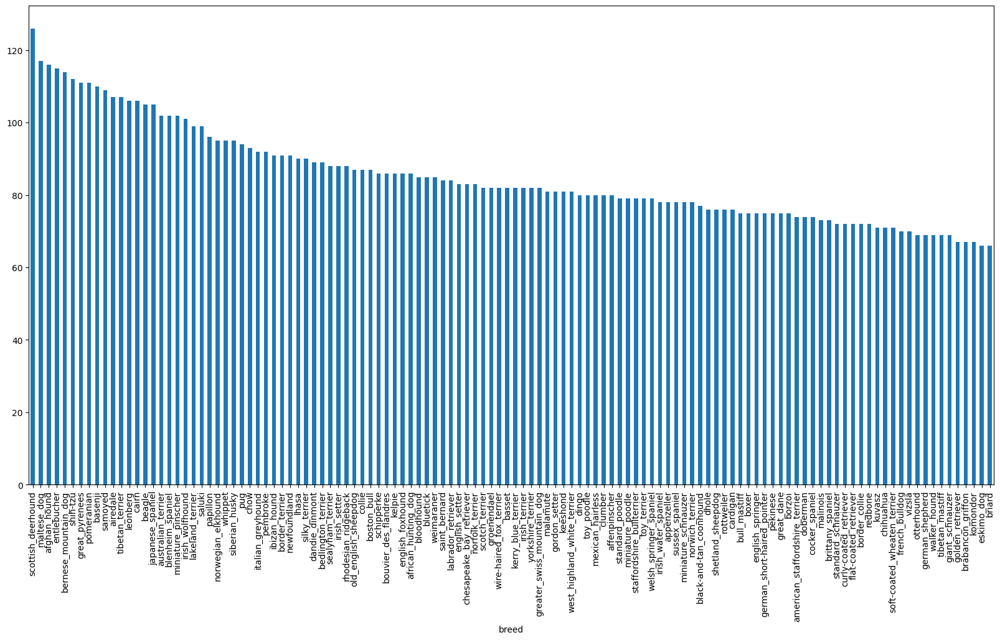

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

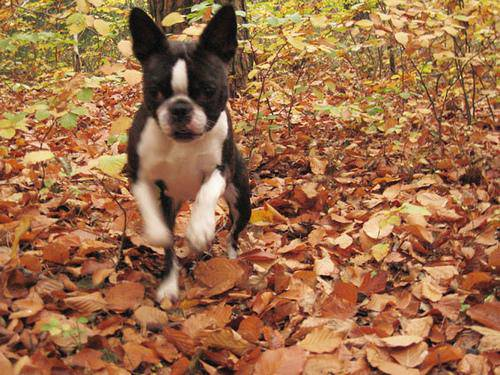

In [ ]:
from IPython.display import Image
Image(filename="/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames=["/content/drive/MyDrive/Dog Vision/train/"+fname+".jpg" for fname in labels_csv['id']]
filenames

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/drive/MyDrive/Dog

In [ ]:
import numpy as np
labels=labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
X=filenames
y=boolean_labels

In [ ]:
NUM_IMAGES=1000 #@param{type:"slider",min:1000,max:10000,step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train,X_valid,y_train,y_valid=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

PREPROCESSING IMAGES

In [ ]:
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
tensor=tf.io.read_file(filenames[42])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor_numerical=tf.io.decode_jpeg(tensor,channels=3)
tensor_numerical[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 88, 138,  87],
        [ 75, 125,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  84],
        [ 76, 134,  86],
        [ 75, 133,  85]],

       [[ 71, 120,  73],
        [ 65, 115,  66],
        [ 62, 112,  63],
        ...,
        [ 73, 131,  83],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
IMG_SIZE=224

def preprocess_image(image_path):
  image=tf.io.read_file(image_path)
  image=tf.image.decode_jpeg(image,channels=3)
  image=tf.image.convert_image_dtype(image,tf.float32)
  image=tf.image.resize(image,[IMG_SIZE,IMG_SIZE])
  return image

TURNING DATA INTO PATCHES

In [ ]:
def get_image_label(image_path,label):
  return preprocess_image(image_path),label

In [ ]:
(preprocess_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
get_image_label(X[42],y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
batch_size=32

def create_data_batches(X,y=None,batch_size=batch_size,valid_data=False,test_data=False):
  if test_data:
    print("Creating Test Batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(preprocess_image).batch(batch_size)
    return data_batch

  elif valid_data:
    print("Creating Validation Batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating Training Batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch


In [ ]:
training_data=create_data_batches(X_train,y_train)
validation_data=create_data_batches(X_valid,y_valid,valid_data=True)

Creating Training Batches...
Creating Validation Batches...


In [ ]:
training_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(iamges,labels):

  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    ax.imshow(iamges[i])
    plt.imshow(iamges[i])
    plt.title(unique_breeds)

BUILDING A MODEL

In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

OUTPUT_SHAPE=len(unique_breeds)

MODEL_URL="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [ ]:
def create_model(input_shape,output_shape,model_url):
  print("Building Model...")
  model=tf.keras.Sequential([
      hub.KerasLayer(model_url),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")
  ])
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

  model.build(input_shape=input_shape)
  return model



In [ ]:
#model=create_model()
#model.summary()

Creating Callbacks

In [ ]:
%load_ext tensorboard



In [ ]:
#TENSORBOARD CALLBACK
import datetime
import os


def create_tensorboard_callback():
  logdir=os.path.join("drive/My Drive/Dog Vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
#EARLY STOPPING CALLBACK(helps in preventing overfitting)

early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

In [ ]:
NUM_EPOCHS=100 #@params{type:slider,min:100,max:1000,step:100}

In [ ]:
def train_model():
  model=create_model(INPUT_SHAPE,OUTPUT_SHAPE,MODEL_URL)
  tensorboard_callback=create_tensorboard_callback()
  model.fit(x=training_data,epochs=NUM_EPOCHS,validation_data=validation_data,callbacks=[tensorboard_callback,early_stopping])
  return model

In [ ]:
model=train_model()

Building Model...
Epoch 1/100
25/25 [==============================] - 135s 5s/step - loss: 4.7017 - accuracy: 0.0862 - val_loss: 3.2830 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 40s 2s/step - loss: 1.5051 - accuracy: 0.7138 - val_loss: 2.0570 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 43s 2s/step - loss: 0.4907 - accuracy: 0.9463 - val_loss: 1.6568 - val_accuracy: 0.6400
Epoch 4/100
25/25 [==============================] - 53s 2s/step - loss: 0.2205 - accuracy: 0.9937 - val_loss: 1.5196 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 39s 2s/step - loss: 0.1314 - accuracy: 0.9975 - val_loss: 1.4578 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 42s 2s/step - loss: 0.0916 - accuracy: 1.0000 - val_loss: 1.4189 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================] - 59s 2s/step - loss: 0.0694 - accuracy: 1.0000 - val_loss: 1.3911 - val_accuracy: 0

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

MAKING PREDCITIONS

In [ ]:
predictions=model.predict(validation_data,verbose=True)
predictions

7/7 [==============================] - 40s 876ms/step


array([[9.73748218e-04, 7.75620108e-04, 4.17217874e-04, ...,
        3.17760161e-04, 3.57280114e-05, 2.48602685e-03],
       [8.57514038e-04, 1.66897923e-02, 8.20808206e-03, ...,
        1.91648433e-03, 1.06086181e-02, 1.74513189e-05],
       [3.67197099e-05, 1.67351347e-04, 8.02602226e-05, ...,
        3.78556695e-04, 3.28526919e-04, 1.50353089e-02],
       ...,
       [3.84136692e-05, 1.04299244e-04, 1.26909172e-05, ...,
        1.92360076e-05, 4.32313915e-04, 5.45642164e-04],
       [1.51570875e-03, 9.73658462e-06, 1.57903869e-05, ...,
        9.16806130e-06, 2.59384851e-05, 4.53642802e-03],
       [7.64982600e-04, 2.23067123e-04, 9.11212410e-04, ...,
        2.49052607e-02, 6.68864045e-03, 3.95731098e-04]], dtype=float32)

In [ ]:
predictions[0].sum()

1.0

In [ ]:
unique_breeds[np.argmax(predictions[0])]

'lhasa'

In [ ]:
predictions.shape

(200, 120)

In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]


In [ ]:
#unbatchinh the batched validation dataset

images_=[]
labels_=[]

for image,label in validation_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(get_pred_label(label))

images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'lhasa'

In [ ]:
def unbatchify(data):
  images_=[]
  labels_=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(get_pred_label(label))
  return images_,labels_

val_images,val_labels=unbatchify(validation_data)

In [ ]:
val_labels[0]

'cairn'

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_probs,true_label,image=prediction_probabilities[n],labels[n],images[n]
  pred_label=get_pred_label(pred_probs)
  plt.imshow(image)
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_probs)*100,true_label),color=color)
  plt.axis(False)

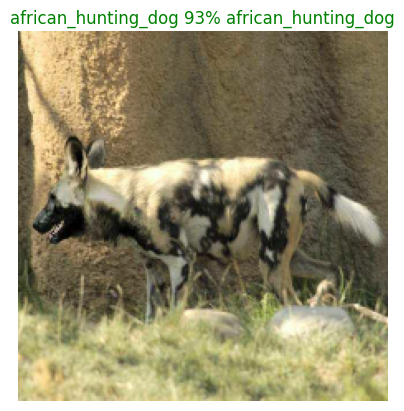

In [ ]:
plot_pred(predictions,val_labels,val_images,17)

In [ ]:
 temp=list(enumerate(predictions[0]))

In [ ]:
sorted_temp=sorted(list(enumerate(predictions[0])),key=lambda x:x[1],reverse=True)

In [ ]:
sorted_temp

[(70, 0.21636353),
 (35, 0.15787318),
 (26, 0.14907251),
 (103, 0.07937435),
 (79, 0.050824586),
 (6, 0.049741607),
 (17, 0.04398231),
 (77, 0.035102826),
 (59, 0.027523313),
 (73, 0.022425111),
 (65, 0.019974263),
 (109, 0.01809755),
 (48, 0.011324851),
 (100, 0.010934602),
 (116, 0.010926132),
 (57, 0.008985575),
 (4, 0.006712682),
 (83, 0.0064544277),
 (97, 0.005650329),
 (23, 0.0055379523),
 (68, 0.0042182985),
 (104, 0.00351814),
 (93, 0.003231584),
 (31, 0.003046144),
 (52, 0.0026927171),
 (8, 0.002580048),
 (20, 0.0025249906),
 (119, 0.0024860268),
 (81, 0.0023325502),
 (74, 0.0015506427),
 (47, 0.0013702924),
 (76, 0.0012081128),
 (21, 0.0011498649),
 (58, 0.0011197891),
 (5, 0.00109473),
 (87, 0.0010830001),
 (115, 0.001045077),
 (106, 0.0009795107),
 (0, 0.0009737482),
 (60, 0.000921518),
 (11, 0.0008509106),
 (94, 0.0007866545),
 (1, 0.0007756201),
 (49, 0.0007299919),
 (82, 0.0007181421),
 (110, 0.0007128695),
 (40, 0.0006944423),
 (102, 0.0006837793),
 (75, 0.0006368196),


In [ ]:
temp_top10=sorted(list(enumerate(predictions[0])),key=lambda x:x[1],reverse=True)[:10]

In [ ]:
temp_top10

[(70, 0.21636353),
 (35, 0.15787318),
 (26, 0.14907251),
 (103, 0.07937435),
 (79, 0.050824586),
 (6, 0.049741607),
 (17, 0.04398231),
 (77, 0.035102826),
 (59, 0.027523313),
 (73, 0.022425111)]

In [ ]:
labels=[]
for i in sorted(list(enumerate(predictions[0])),key=lambda x:x[1],reverse=True)[:10]:
  labels.append(unique_breeds[i[0]])

In [ ]:
labels

['lhasa',
 'dandie_dinmont',
 'cairn',
 'soft-coated_wheaten_terrier',
 'norfolk_terrier',
 'australian_terrier',
 'border_terrier',
 'miniature_schnauzer',
 'irish_wolfhound',
 'maltese_dog']

In [ ]:
get_pred_label(predictions[0])

'lhasa'

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_probs,true_label=prediction_probabilities[n],labels[n]
  pred_label=get_pred_label(pred_probs)
  top_10_pred_labels=[]
  top_10_pred_values=[]
  for i in sorted(list(enumerate(predictions[n])),key=lambda x:x[1],reverse=True)[:10]:
    top_10_pred_labels.append(unique_breeds[i[0]])
    top_10_pred_values.append(i[1])


  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="green")
  plt.xticks(np.arange(len(top_10_pred_labels)),top_10_pred_labels,rotation="vertical")
  plt.show()


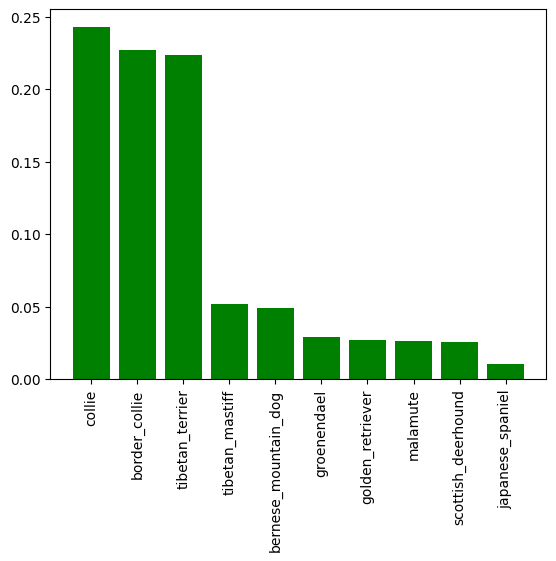

In [ ]:
plot_pred_conf(predictions,val_labels,9)

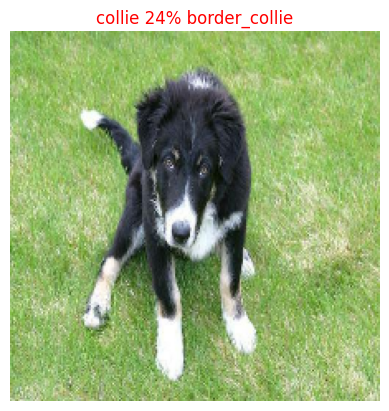

In [ ]:
plot_pred(predictions,val_labels,val_images,9)

<ipython-input-63-6cf62d008b76>:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(nrows,2*ncols,2*i+2)


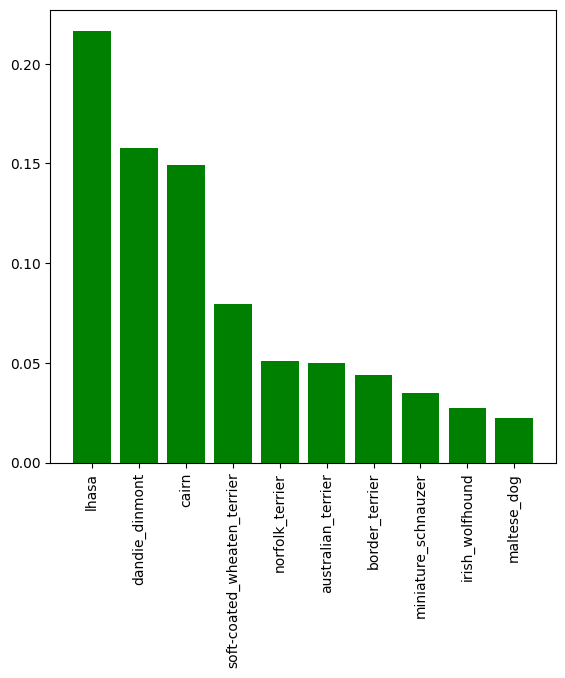

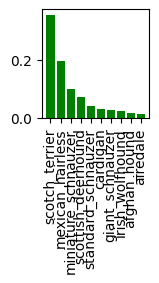

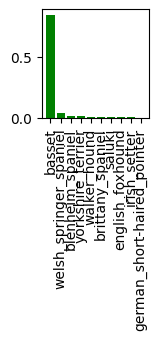

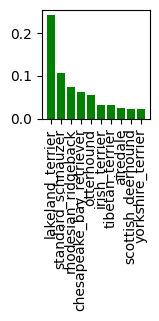

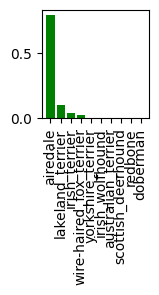

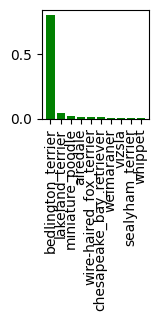

<Figure size 640x480 with 0 Axes>

In [ ]:
i_multiplier=0
nrows=3
ncols=2
nimages=nrows*ncols
plt.figure(figsize=(10*nrows,10*ncols))
for i in range(nimages):
  plt.subplot(nrows,ncols,i+1)
  plot_pred(predictions,val_labels,val_images,n=i+i_multiplier)
  plt.subplot(nrows,2*ncols,2*i+2)
  plot_pred_conf(predictions,val_labels,n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


In [ ]:
def save_model(model,suffix=None):
  model_dir=os.path.join("drive/My Drive/Dog Vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=model_dir+"-"+suffix+".h5"
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"Loading saved model from {model_path}...")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to drive/My Drive/Dog Vision/models/20240727-10221722075740-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240727-10221722075740-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_images_model=load_model('/content/drive/MyDrive/Dog Vision/models/20240725-15531721922825-1000-images-mobilenetv2-Adam.h5')

Loading saved model from /content/drive/MyDrive/Dog Vision/models/20240725-15531721922825-1000-images-mobilenetv2-Adam.h5...


In [ ]:
model.evaluate(validation_data)

7/7 [==============================] - 7s 953ms/step - loss: 1.3409 - accuracy: 0.6800


[1.3408691883087158, 0.6800000071525574]

In [ ]:
loaded_1000_images_model.evaluate(validation_data)

7/7 [==============================] - 9s 932ms/step - loss: 1.2192 - accuracy: 0.6650


[1.2191623449325562, 0.6650000214576721]

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
full_data=create_data_batches(X,y)

Creating Training Batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model(INPUT_SHAPE,OUTPUT_SHAPE,MODEL_URL)

Building Model...


In [ ]:
full_model_tensorboard=create_tensorboard_callback()

full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)



In [ ]:
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
297/320 [==========================>...] - ETA: 1:13 - loss: 1.3874 - accuracy: 0.6561

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-75-a9e19fab718b>", line 1, in <cell line: 1>
    full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1807, in fit
    tmp_logs = self.train_function(iterator)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/traceback_utils.py", line 150, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function.py", line 832, in __call__
    result = self._call(*args, **kwds)
  File "/usr

TypeError: object of type 'NoneType' has no len()

In [ ]:
save_model(full_model,suffix="full-data-images-mobilenetv2-Adam")

Saving model to drive/My Drive/Dog Vision/models/20240727-10381722076733-full-data-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240727-10381722076733-full-data-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_full=load_model('/content/drive/MyDrive/Dog Vision/models/20240726-15351722008138-full-data-images-mobilenetv2-Adam.h5')

Loading saved model from /content/drive/MyDrive/Dog Vision/models/20240726-15351722008138-full-data-images-mobilenetv2-Adam.h5...


MAKING PREDICTIONS ON TEST DATA

In [ ]:
test_path="/content/drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e0f9b92adbba451d296678f466732969.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ddfbebe13aa8fba30f347c58466215df.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6295bd4afe5ddf93a02cbd668819e9e.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e4c743b9aaf615dd5fe162bf25f82fb5.jpg',
 '/content/drive/MyDrive/Dog Vision/test/de172eece3080506aa3bcf1967f4a90b.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e76a7a1d23d687b5015b07df762c0c10.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e1444b7c629f6775432269bfd9c7e758.jpg',
 '/content/drive/MyDrive/Dog Vision/test/de90fcd52b9c527ea097d88804985516.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dccc6c6c2f8cb55631b6ce664bf21fee.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6af47e8b6973c8f8d2b9fd5af94c54d.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)

Creating Test Batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions=loaded_full.predict(test_data,verbose=True)

324/324 [==============================] - 722s 2s/step


In [ ]:
np.savetxt("drive/MyDrive/Dog Vision/predictions/test_predictions.txt",test_predictions,delimiter=",")

In [ ]:
test_predictions=np.loadtxt("drive/MyDrive/Dog Vision/predictions/test_predictions.txt",delimiter=",")

In [ ]:
test_predictions[:10]

array([[8.61206995e-10, 5.65616076e-13, 7.04286629e-11, ...,
        6.88341686e-08, 6.23063158e-07, 6.88812452e-10],
       [4.88528606e-10, 4.46101156e-09, 8.62256877e-10, ...,
        8.33674729e-09, 1.63553992e-07, 4.01715897e-06],
       [9.81130385e-11, 9.54216428e-11, 7.55059071e-11, ...,
        1.46971820e-06, 2.08935466e-10, 6.54312160e-11],
       ...,
       [7.24893823e-07, 8.77684680e-09, 6.12250539e-13, ...,
        1.87597984e-13, 1.76121215e-08, 6.83191489e-11],
       [6.64147237e-10, 1.31547236e-12, 1.09695959e-11, ...,
        2.81930555e-12, 5.00446547e-14, 6.13405368e-11],
       [9.47091472e-09, 5.29290789e-09, 7.05738040e-13, ...,
        3.16338483e-10, 5.70491625e-13, 2.66798476e-11]])

In [ ]:
import pandas as pd

preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0f9b92adbba451d296678f466732969,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ddfbebe13aa8fba30f347c58466215df,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e6295bd4afe5ddf93a02cbd668819e9e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4c743b9aaf615dd5fe162bf25f82fb5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,de172eece3080506aa3bcf1967f4a90b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)]=test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0f9b92adbba451d296678f466732969,8.612070e-10,5.656161e-13,7.042866e-11,1.021876e-10,1.099528e-08,2.568617e-07,1.466729e-07,9.928977e-01,9.642333e-11,...,3.779986e-10,7.085708e-03,2.367356e-09,1.633851e-06,2.394035e-11,2.164326e-10,3.855240e-07,6.883417e-08,6.230632e-07,6.888125e-10
1,ddfbebe13aa8fba30f347c58466215df,4.885286e-10,4.461012e-09,8.622569e-10,7.819962e-09,1.065040e-05,3.755081e-05,1.258478e-07,2.528227e-04,3.381318e-03,...,9.628812e-09,1.261250e-06,5.331090e-10,9.205385e-03,4.008653e-09,5.800561e-07,3.477114e-07,8.336747e-09,1.635540e-07,4.017159e-06
2,e6295bd4afe5ddf93a02cbd668819e9e,9.811304e-11,9.542164e-11,7.550591e-11,6.273174e-12,4.617434e-10,1.206831e-08,1.696651e-11,1.995906e-06,2.867468e-10,...,1.504581e-10,1.166908e-09,7.158572e-09,5.843325e-09,7.531661e-11,6.429111e-11,1.028517e-11,1.469718e-06,2.089355e-10,6.543122e-11
3,e4c743b9aaf615dd5fe162bf25f82fb5,7.272909e-13,7.657659e-13,1.434406e-13,1.929209e-11,4.266851e-11,3.043254e-09,6.478219e-12,2.188589e-10,3.969463e-12,...,1.147835e-12,7.648810e-10,9.925120e-14,5.317912e-12,4.664951e-14,1.151699e-13,2.665202e-11,1.582353e-12,9.999997e-01,9.713612e-16
4,de172eece3080506aa3bcf1967f4a90b,1.336215e-10,4.294661e-07,6.025226e-12,3.164307e-10,6.103309e-09,1.279871e-11,2.474548e-10,2.337318e-12,1.244768e-09,...,1.388664e-07,2.449815e-12,3.800175e-10,2.217126e-13,1.315266e-10,1.115686e-06,8.703412e-11,7.554016e-11,1.349670e-11,1.156515e-10


In [ ]:
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_prediction.csv",index=False)

In [ ]:
custom_path="drive/MyDrive/Dog Vision/dogs/"
custom_imahge_paths=[custom_path+fname for fname in os.listdir(custom_path) if fname.split(".")[1]=="jpg"]
custom_imahge_paths

['drive/MyDrive/Dog Vision/dogs/dog1.jpg',
 'drive/MyDrive/Dog Vision/dogs/dog2.jpg',
 'drive/MyDrive/Dog Vision/dogs/dog3.jpg']

In [ ]:
custom_data=create_data_batches(custom_imahge_paths,test_data=True)

Creating Test Batches...


In [ ]:
custom_preds=loaded_full.predict(custom_data)

1/1 [==============================] - 0s 316ms/step


In [ ]:
custom_pred_labels=[get_pred_label(i) for i in custom_preds]
percentage=[np.max(i)*100 for i in custom_preds]

In [ ]:
custom_pred_labels,percentage


(['beagle', 'golden_retriever', 'samoyed'],
 [99.99994039535522, 99.70665574073792, 99.21327233314514])

In [ ]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)


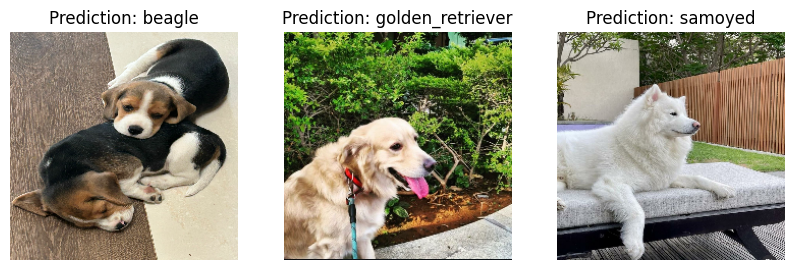

In [ ]:
plt.figure(figsize=(10, 10))

for i,image in enumerate(custom_images):
  plt.subplot(1,len(custom_images), i+1)

  plt.imshow(image)
  plt.title(f"Prediction: {custom_pred_labels[i]}")
  plt.axis(False)